<a href="https://colab.research.google.com/github/AmoghTantradi/CS182-final-project/blob/main/Hyper_Param_Search_sd_dreambooth_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dreambooth fine-tuning for Stable Diffusion using diffusers

This notebook shows how to "teach" Stable Diffusion a new concept via Dreambooth using 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers).

![Dreambooth Example](https://dreambooth.github.io/DreamBooth_files/teaser_static.jpg)
_By using just 3-5 images you can teach new concepts to Stable Diffusion and personalize the model on your own images_

We will be using the images of Oski as a new concept to find the best hyperparameters(learning rate, prior perservation weight") that result in the best quality according to our metric


## Initial setup

In [ ]:
#@title Install the required libs
!pip install -U -qq git+https://github.com/huggingface/diffusers.git
!pip install -qq accelerate tensorboard transformers ftfy gradio
!pip install -qq "ipywidgets>=7,<8"
!pip install -qq bitsandbytes

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 95.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.9/92.9 kB 14.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.7/302.7 kB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 10.1 MB/s eta 0:00:00
     ━━━━

In [ ]:
#@title [Optional] Install xformers for faster and memory efficient training
#@markdown Acknowledgement: The xformers wheel are taken from [TheLastBen/fast-stable-diffusion](https://github.com/TheLastBen/fast-stable-diffusion). Thanks a lot for building these wheels!
%%time

!pip install -U --pre triton

from subprocess import getoutput
from IPython.display import HTML
from IPython.display import clear_output
import time

s = getoutput('nvidia-smi')
if 'T4' in s:
  gpu = 'T4'
elif 'P100' in s:
  gpu = 'P100'
elif 'V100' in s:
  gpu = 'V100'
elif 'A100' in s:
  gpu = 'A100'

while True:
    try:
        gpu=='T4'or gpu=='P100'or gpu=='V100'or gpu=='A100'
        break
    except:
        pass
    print('[1;31mit seems that your GPU is not supported at the moment')
    time.sleep(5)

if (gpu=='T4'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/T4/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='P100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/P100/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='V100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/V100/xformers-0.0.13.dev0-py3-none-any.whl

elif (gpu=='A100'):
  %pip install -q https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl

  ERROR: HTTP error 404 while getting https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl
ERROR: Could not install requirement xformers==0.0.13.dev0 from https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl because of HTTP error 404 Client Error: Not Found for url: https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl for URL https://github.com/TheLastBen/fast-stable-diffusion/raw/main/precompiled/A100/xformers-0.0.13.dev0-py3-none-any.whl
CPU times: user 21.6 ms, sys: 1.83 ms, total: 23.5 ms
Wall time: 6.26 s


In [ ]:
#@title Import required libraries
import argparse
import itertools
import math
import os
from contextlib import nullcontext
import random

import numpy as np
import torch
import torch.nn.functional as F
import torch.utils.checkpoint
from torch.utils.data import Dataset

import PIL
from accelerate import Accelerator
from accelerate.logging import get_logger
from accelerate.utils import set_seed
from diffusers import AutoencoderKL, DDPMScheduler, PNDMScheduler, StableDiffusionPipeline, UNet2DConditionModel
from diffusers.optimization import get_scheduler
from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from PIL import Image
from torchvision import transforms
from tqdm.auto import tqdm
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

import bitsandbytes as bnb

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## Settings for teaching your new concept

In [ ]:
#@markdown `pretrained_model_name_or_path` which Stable Diffusion checkpoint you want to use
pretrained_model_name_or_path = "stabilityai/stable-diffusion-2" #@param ["stabilityai/stable-diffusion-2", "stabilityai/stable-diffusion-2-base", "CompVis/stable-diffusion-v1-4", "runwayml/stable-diffusion-v1-5"] {allow-input: true}

In [ ]:
#@markdown Add here the URLs to the images of the concept you are adding. 3-5 should be fine
urls = [
      "https://huggingface.co/datasets/valhalla/images/resolve/main/2.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/3.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/5.jpeg",
      "https://huggingface.co/datasets/valhalla/images/resolve/main/6.jpeg",
      ## You can add additional images here
      ]

## In this section, rather than use URLs, we simply replace the images in 'my_concept' folder with our own dataset images prior to running the training.


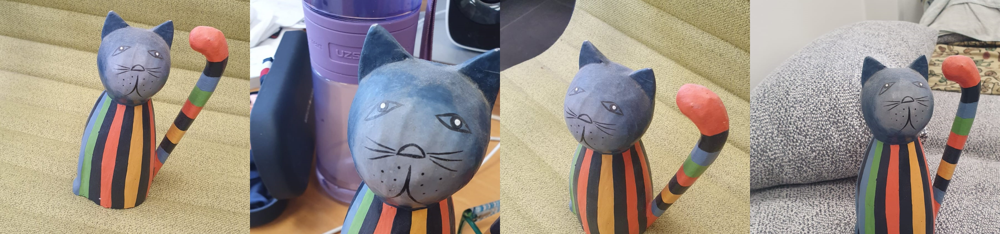

In [ ]:
#@title Setup and check the images you have just added
import requests
import glob
from io import BytesIO

def download_image(url):
  try:
    response = requests.get(url)
  except:
    return None
  return Image.open(BytesIO(response.content)).convert("RGB")

images = list(filter(None,[download_image(url) for url in urls]))
save_path = "./my_concept"
if not os.path.exists(save_path):
  os.mkdir(save_path)
[image.save(f"{save_path}/{i}.jpeg") for i, image in enumerate(images)]
image_grid(images, 1, len(images))

In [ ]:
##In this case, 'bear' is the class name, and "Zephon" is the uniqud identifier.

#@title Settings for your newly created concept
#@markdown `instance_prompt` is a prompt that should contain a good description of what your object or style is, together with the initializer word `cat_toy`
instance_prompt = "Zephon bear" #@param {type:"string"}
#@markdown Check the `prior_preservation` option if you would like class of the concept (e.g.: toy, dog, painting) is guaranteed to be preserved. This increases the quality and helps with generalization at the cost of training time
prior_preservation = True #@param {type:"boolean"}
prior_preservation_class_prompt = "bear" #@param {type:"string"}

num_class_images = 12
sample_batch_size = 2
prior_loss_weight = 0.5
prior_preservation_class_folder = "./class_images"
class_data_root=prior_preservation_class_folder
class_prompt=prior_preservation_class_prompt

#### Advanced settings for prior preservation (optional)

In [ ]:
num_class_images = 12 #@param {type: "number"}
sample_batch_size = 2
#@markdown `prior_preservation_weight` determins how strong the class for prior preservation should be
prior_loss_weight = .2 #@param {type: "number"}


#@markdown If the `prior_preservation_class_folder` is empty, images for the class will be generated with the class prompt. Otherwise, fill this folder with images of items on the same class as your concept (but not images of the concept itself)
prior_preservation_class_folder = "./class_images" #@param {type:"string"}
class_data_root=prior_preservation_class_folder

## Teach the model the new concept (fine-tuning with Dreambooth)
Execute this this sequence of cells to run the training process. The whole process may take from 15 min to 2 hours. (Open this block if you are interested in how this process works under the hood or if you want to change advanced training settings or hyperparameters)

In [ ]:
#@title Setup the Classes
from pathlib import Path
from torchvision import transforms

class DreamBoothDataset(Dataset):
    def __init__(
        self,
        instance_data_root,
        instance_prompt,
        tokenizer,
        class_data_root=None,
        class_prompt=None,
        size=512,
        center_crop=False,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError("Instance images root doesn't exists.")

        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)
        self.instance_prompt = instance_prompt
        self._length = self.num_instance_images




        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            self.class_data_root.mkdir(parents=True, exist_ok=True)
            self.class_images_path = list(Path(class_data_root).iterdir())
            self.num_class_images = len(self.class_images_path)
            self._length = max(self.num_class_images, self.num_instance_images)
            self.class_prompt = class_prompt
        else:
            self.class_data_root = None

        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

    def __len__(self):
        return self._length

    def __getitem__(self, index):
        example = {}
        instance_image = Image.open(self.instance_images_path[index % self.num_instance_images])
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
        example["instance_images"] = self.image_transforms(instance_image)
        example["instance_prompt_ids"] = self.tokenizer(
            self.instance_prompt,
            padding="do_not_pad",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
        ).input_ids

        if self.class_data_root:
            class_image = Image.open(self.class_images_path[index % self.num_class_images])
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
            example["class_images"] = self.image_transforms(class_image)
            example["class_prompt_ids"] = self.tokenizer(
                self.class_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids

        return example


class PromptDataset(Dataset):
    def __init__(self, prompt, num_samples):
        self.prompt = prompt
        self.num_samples = num_samples

    def __len__(self):
        return self.num_samples

    def __getitem__(self, index):
        example = {}
        example["prompt"] = self.prompt
        example["index"] = index
        return example

In [ ]:
#@title Generate Class Images
import gc
if(prior_preservation):
    class_images_dir = Path(class_data_root)
    if not class_images_dir.exists():
        class_images_dir.mkdir(parents=True)
    cur_class_images = len(list(class_images_dir.iterdir()))

    if cur_class_images < num_class_images:
        pipeline = StableDiffusionPipeline.from_pretrained(
            pretrained_model_name_or_path, revision="fp16", torch_dtype=torch.float16
        ).to("cuda")
        pipeline.enable_attention_slicing()
        pipeline.set_progress_bar_config(disable=True)

        num_new_images = num_class_images - cur_class_images
        print(f"Number of class images to sample: {num_new_images}.")

        sample_dataset = PromptDataset(class_prompt, num_new_images)
        sample_dataloader = torch.utils.data.DataLoader(sample_dataset, batch_size=sample_batch_size)

        for example in tqdm(sample_dataloader, desc="Generating class images"):
            images = pipeline(example["prompt"]).images

            for i, image in enumerate(images):
                image.save(class_images_dir / f"{example['index'][i] + cur_class_images}.jpg")
        pipeline = None
        gc.collect()
        del pipeline
        with torch.no_grad():
          torch.cuda.empty_cache()

model_index.json:   0%|          | 0.00/511 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_utils.py:263: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
vae/diffusion_pytorch_model.safetensors not found


Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/624 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/815 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/900 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/602 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Number of class images to sample: 12.


Generating class images:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
#@title Load the Stable Diffusion model
# Load models and create wrapper for stable diffusion
text_encoder = CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder"
)
vae = AutoencoderKL.from_pretrained(
    pretrained_model_name_or_path, subfolder="vae"
)
unet = UNet2DConditionModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="unet"
)
tokenizer = CLIPTokenizer.from_pretrained(
    pretrained_model_name_or_path,
    subfolder="tokenizer",
)

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/909 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

In [ ]:
#@title Setting up all training args
from argparse import Namespace
args = Namespace(
    pretrained_model_name_or_path=pretrained_model_name_or_path,
    resolution=vae.sample_size,
    center_crop=True,
    train_text_encoder=False,
    instance_data_dir=save_path,
    instance_prompt=instance_prompt,
    learning_rate=5e-06,
    max_train_steps=900,
    save_steps=1000,
    train_batch_size=1, # set to 1 if using prior preservation
    gradient_accumulation_steps=2,
    max_grad_norm=1.0,
    mixed_precision="fp16", # set to "fp16" for mixed-precision training.
    gradient_checkpointing=True, # set this to True to lower the memory usage.
    use_8bit_adam=True, # use 8bit optimizer from bitsandbytes
    seed=3434554,
    with_prior_preservation=prior_preservation,
    prior_loss_weight=prior_loss_weight,
    sample_batch_size=2,
    class_data_dir=prior_preservation_class_folder,
    class_prompt=prior_preservation_class_prompt,
    num_class_images=num_class_images,
    lr_scheduler="constant",
    lr_warmup_steps=100,
    output_dir="dreambooth-concept",
)

<ipython-input-18-1b378a001f05>:5: FutureWarning: Accessing config attribute `sample_size` directly via 'AutoencoderKL' object attribute is deprecated. Please access 'sample_size' over 'AutoencoderKL's config object instead, e.g. 'unet.config.sample_size'.
  resolution=vae.sample_size,


In [ ]:
instance_loss = []
class_loss = []

In [ ]:
#@title Training function
from accelerate.utils import set_seed
def training_function(text_encoder, vae, unet):
    logger = get_logger(__name__)

    set_seed(args.seed)

    accelerator = Accelerator(
        gradient_accumulation_steps=args.gradient_accumulation_steps,
        mixed_precision=args.mixed_precision,
    )

    # Currently, it's not possible to do gradient accumulation when training two models with accelerate.accumulate
    # This will be enabled soon in accelerate. For now, we don't allow gradient accumulation when training two models.
    # TODO (patil-suraj): Remove this check when gradient accumulation with two models is enabled in accelerate.
    if args.train_text_encoder and args.gradient_accumulation_steps > 1 and accelerator.num_processes > 1:
        raise ValueError(
            "Gradient accumulation is not supported when training the text encoder in distributed training. "
            "Please set gradient_accumulation_steps to 1. This feature will be supported in the future."
        )

    vae.requires_grad_(False)
    if not args.train_text_encoder:
        text_encoder.requires_grad_(False)

    if args.gradient_checkpointing:
        unet.enable_gradient_checkpointing()
        if args.train_text_encoder:
            text_encoder.gradient_checkpointing_enable()

    # Use 8-bit Adam for lower memory usage or to fine-tune the model in 16GB GPUs
    if args.use_8bit_adam:
        optimizer_class = bnb.optim.AdamW8bit
    else:
        optimizer_class = torch.optim.AdamW

    params_to_optimize = (
        itertools.chain(unet.parameters(), text_encoder.parameters()) if args.train_text_encoder else unet.parameters()
    )

    optimizer = optimizer_class(
        params_to_optimize,
        lr=args.learning_rate,
    )

    noise_scheduler = DDPMScheduler.from_config(args.pretrained_model_name_or_path, subfolder="scheduler")

    train_dataset = DreamBoothDataset(
        instance_data_root=args.instance_data_dir,
        instance_prompt=args.instance_prompt,
        class_data_root=args.class_data_dir if args.with_prior_preservation else None,
        class_prompt=args.class_prompt,
        tokenizer=tokenizer,
        size=args.resolution,
        center_crop=args.center_crop,
    )

    def collate_fn(examples):
        input_ids = [example["instance_prompt_ids"] for example in examples]
        pixel_values = [example["instance_images"] for example in examples]

        # concat class and instance examples for prior preservation
        if args.with_prior_preservation:
            input_ids += [example["class_prompt_ids"] for example in examples]
            pixel_values += [example["class_images"] for example in examples]

        pixel_values = torch.stack(pixel_values)
        pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

        input_ids = tokenizer.pad(
            {"input_ids": input_ids},
            padding="max_length",
            return_tensors="pt",
            max_length=tokenizer.model_max_length
        ).input_ids

        batch = {
            "input_ids": input_ids,
            "pixel_values": pixel_values,
        }
        return batch

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=args.train_batch_size, shuffle=True, collate_fn=collate_fn
    )

    lr_scheduler = get_scheduler(
        args.lr_scheduler,
        optimizer=optimizer,
        num_warmup_steps=args.lr_warmup_steps * args.gradient_accumulation_steps,
        num_training_steps=args.max_train_steps * args.gradient_accumulation_steps,
    )

    if args.train_text_encoder:
        unet, text_encoder, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, text_encoder, optimizer, train_dataloader, lr_scheduler
        )
    else:
        unet, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, optimizer, train_dataloader, lr_scheduler
        )

    weight_dtype = torch.float32
    if accelerator.mixed_precision == "fp16":
        weight_dtype = torch.float16
    elif accelerator.mixed_precision == "bf16":
        weight_dtype = torch.bfloat16

    # Move text_encode and vae to gpu.
    # For mixed precision training we cast the text_encoder and vae weights to half-precision
    # as these models are only used for inference, keeping weights in full precision is not required.
    vae.to(accelerator.device, dtype=weight_dtype)
    vae.decoder.to("cpu")
    if not args.train_text_encoder:
        text_encoder.to(accelerator.device, dtype=weight_dtype)

    # We need to recalculate our total training steps as the size of the training dataloader may have changed.
    num_update_steps_per_epoch = math.ceil(len(train_dataloader) / args.gradient_accumulation_steps)
    num_train_epochs = math.ceil(args.max_train_steps / num_update_steps_per_epoch)

    # Train!
    total_batch_size = args.train_batch_size * accelerator.num_processes * args.gradient_accumulation_steps

    logger.info("***** Running training *****")
    logger.info(f"  Num examples = {len(train_dataset)}")
    logger.info(f"  Instantaneous batch size per device = {args.train_batch_size}")
    logger.info(f"  Total train batch size (w. parallel, distributed & accumulation) = {total_batch_size}")
    logger.info(f"  Gradient Accumulation steps = {args.gradient_accumulation_steps}")
    logger.info(f"  Total optimization steps = {args.max_train_steps}")
    # Only show the progress bar once on each machine.
    progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")
    global_step = 0

    for epoch in range(num_train_epochs):
        unet.train()
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(unet):
                # Convert images to latent space
                latents = vae.encode(batch["pixel_values"].to(dtype=weight_dtype)).latent_dist.sample()
                latents = latents * 0.18215

                # Sample noise that we'll add to the latents
                noise = torch.randn_like(latents)
                bsz = latents.shape[0]
                # Sample a random timestep for each image
                timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=latents.device)
                timesteps = timesteps.long()

                # Add noise to the latents according to the noise magnitude at each timestep
                # (this is the forward diffusion process)
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

                # Get the text embedding for conditioning
                encoder_hidden_states = text_encoder(batch["input_ids"])[0]

                # Predict the noise residual
                noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

                # Get the target for loss depending on the prediction type
                if noise_scheduler.config.prediction_type == "epsilon":
                    target = noise
                elif noise_scheduler.config.prediction_type == "v_prediction":
                    target = noise_scheduler.get_velocity(latents, noise, timesteps)
                else:
                    raise ValueError(f"Unknown prediction type {noise_scheduler.config.prediction_type}")

                if args.with_prior_preservation:
                    # Chunk the noise and noise_pred into two parts and compute the loss on each part separately.
                    noise_pred, noise_pred_prior = torch.chunk(noise_pred, 2, dim=0)
                    target, target_prior = torch.chunk(target, 2, dim=0)

                    # Compute instance loss
                    loss = F.mse_loss(noise_pred.float(), target.float(), reduction="none").mean([1, 2, 3]).mean()
                    instance_loss.append(loss)
                    # Compute prior loss
                    prior_loss = F.mse_loss(noise_pred_prior.float(), target_prior.float(), reduction="mean")
                    class_loss.append(prior_loss)
                    # Add the prior loss to the instance loss.
                    loss = loss + args.prior_loss_weight * prior_loss
                else:
                    loss = F.mse_loss(noise_pred.float(), target.float(), reduction="mean")
                    instance_loss.append(loss)

                accelerator.backward(loss)

                if accelerator.sync_gradients:
                    params_to_clip = (
                        itertools.chain(unet.parameters(), text_encoder.parameters())
                        if args.train_text_encoder
                        else unet.parameters()
                    )
                    accelerator.clip_grad_norm_(unet.parameters(), args.max_grad_norm)
                optimizer.step()
                optimizer.zero_grad()

            # Checks if the accelerator has performed an optimization step behind the scenes
            if accelerator.sync_gradients:
                progress_bar.update(1)
                global_step += 1

                if global_step % args.save_steps == 0:
                    if accelerator.is_main_process:
                        pipeline = StableDiffusionPipeline.from_pretrained(
                            args.pretrained_model_name_or_path,
                            unet=accelerator.unwrap_model(unet),
                            text_encoder=accelerator.unwrap_model(text_encoder),
                        )
                        save_path = os.path.join(args.output_dir, f"checkpoint-{global_step}")
                        pipeline.save_pretrained(save_path)

            logs = {"loss": loss.detach().item()}
            progress_bar.set_postfix(**logs)

            if global_step >= args.max_train_steps:
                break

        accelerator.wait_for_everyone()

    # Create the pipeline using using the trained modules and save it.
    if accelerator.is_main_process:
        pipeline = StableDiffusionPipeline.from_pretrained(
            args.pretrained_model_name_or_path,
            unet=accelerator.unwrap_model(unet),
            text_encoder=accelerator.unwrap_model(text_encoder),
        )
        pipeline.save_pretrained(args.output_dir)

In [ ]:
#@title Run training
import accelerate
accelerate.notebook_launcher(training_function, args=(text_encoder, vae, unet))
for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
  if param.grad is not None:
    del param.grad  # free some memory
  torch.cuda.empty_cache()

Launching training on one GPU.


  0%|          | 0/900 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

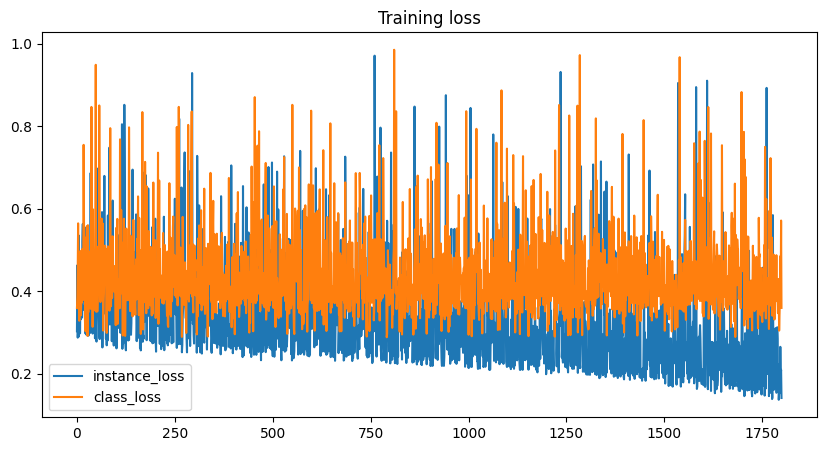

In [ ]:
#This generates the Loss curves for the Training
import matplotlib.pyplot as plt
_instance_loss = [loss.cpu().detach().numpy().item() for loss in instance_loss]
_class_loss = [loss.cpu().detach().numpy().item() for loss in class_loss]
plt.figure(figsize=(10, 5))
plt.title("Training loss")
plt.plot(_instance_loss, label="instance_loss")
plt.plot(_class_loss, label="class_loss")
plt.legend()
plt.show()

## Run the code with your newly trained model
If you have just trained your model with the code above, use the block below to run it.

Also explore the [DreamBooth Concepts Library](https://huggingface.co/sd-dreambooth-library)

In [ ]:
#@title Save your newly created concept? you may save it privately to your personal profile or collaborate to the [library of concepts](https://huggingface.co/sd-dreambooth-library)?
#@markdown If you wish your model to be avaliable for everyone, add it to the public library. If you prefer to use your model privately, add your own profile.

save_concept = True #@param {type:"boolean"}
#@markdown Once you save it you can use your concept by loading the model on any `from_pretrained` function
name_of_your_concept = "Cat toy" #@param {type:"string"}
where_to_save_concept = "public_library" #@param ["public_library", "privately_to_my_profile"]

#@markdown `hf_token_write`: leave blank if you logged in with a token with `write access` in the [Initial Setup](#scrollTo=KbzZ9xe6dWwf). If not, [go to your tokens settings and create a write access token](https://huggingface.co/settings/tokens)
hf_token_write = "" #@param {type:"string"}
if(save_concept):
  from slugify import slugify
  from huggingface_hub import HfApi, HfFolder, CommitOperationAdd
  from huggingface_hub import create_repo
  from IPython.display import display_markdown
  api = HfApi()
  your_username = api.whoami()["name"]
  pipe = StableDiffusionPipeline.from_pretrained(
    args.output_dir,
    torch_dtype=torch.float16,
  ).to("cuda")
  os.makedirs("fp16_model",exist_ok=True)
  pipe.save_pretrained("fp16_model")

  if(where_to_save_concept == "public_library"):
    repo_id = f"sd-dreambooth-library/{slugify(name_of_your_concept)}"
    #Join the Concepts Library organization if you aren't part of it already
    !curl -X POST -H 'Authorization: Bearer '$hf_token -H 'Content-Type: application/json' https://huggingface.co/organizations/sd-dreambooth-library/share/SSeOwppVCscfTEzFGQaqpfcjukVeNrKNHX
  else:
    repo_id = f"{your_username}/{slugify(name_of_your_concept)}"
  output_dir = args.output_dir
  if(not hf_token_write):
    with open(HfFolder.path_token, 'r') as fin: hf_token = fin.read();
  else:
    hf_token = hf_token_write

  images_upload = os.listdir("my_concept")
  image_string = ""
  #repo_id = f"sd-dreambooth-library/{slugify(name_of_your_concept)}"
  for i, image in enumerate(images_upload):
      image_string = f'''{image_string}![image {i}](https://huggingface.co/{repo_id}/resolve/main/concept_images/{image})
'''
  readme_text = f'''---
license: creativeml-openrail-m
tags:
- text-to-image
---
### {name_of_your_concept} on Stable Diffusion via Dreambooth
#### model by {api.whoami()["name"]}
This your the Stable Diffusion model fine-tuned the {name_of_your_concept} concept taught to Stable Diffusion with Dreambooth.
It can be used by modifying the `instance_prompt`: **{instance_prompt}**

You can also train your own concepts and upload them to the library by using [this notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/sd_dreambooth_training.ipynb).
And you can run your new concept via `diffusers`: [Colab Notebook for Inference](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/sd_dreambooth_inference.ipynb), [Spaces with the Public Concepts loaded](https://huggingface.co/spaces/sd-dreambooth-library/stable-diffusion-dreambooth-concepts)

Here are the images used for training this concept:
{image_string}
'''
  #Save the readme to a file
  readme_file = open("README.md", "w")
  readme_file.write(readme_text)
  readme_file.close()
  #Save the token identifier to a file
  text_file = open("token_identifier.txt", "w")
  text_file.write(instance_prompt)
  text_file.close()
  operations = [
    CommitOperationAdd(path_in_repo="token_identifier.txt", path_or_fileobj="token_identifier.txt"),
    CommitOperationAdd(path_in_repo="README.md", path_or_fileobj="README.md"),
  ]
  create_repo(repo_id,private=True, token=hf_token)

  api.create_commit(
    repo_id=repo_id,
    operations=operations,
    commit_message=f"Upload the concept {name_of_your_concept} embeds and token",
    token=hf_token
  )
  api.upload_folder(
    folder_path="fp16_model",
    path_in_repo="",
    repo_id=repo_id,
    token=hf_token
  )
  api.upload_folder(
    folder_path=save_path,
    path_in_repo="concept_images",
    repo_id=repo_id,
    token=hf_token
  )
display_markdown(f'''## Your concept was saved successfully. [Click here to access it](https://huggingface.co/{repo_id})
''', raw=True)

LocalTokenNotFoundError: ignored

In [ ]:
#@title Set up the pipeline
from diffusers import DPMSolverMultistepScheduler
try:
    pipe
except NameError:
    pipe = StableDiffusionPipeline.from_pretrained(
        args.output_dir,
        scheduler = DPMSolverMultistepScheduler.from_pretrained(args.output_dir, subfolder="scheduler"),
        torch_dtype=torch.float16,
    ).to("cuda")

#CHANGE THIS OUT
pipe = StableDiffusionPipeline.from_pretrained(
        args.output_dir,
        scheduler = DPMSolverMultistepScheduler.from_pretrained(args.output_dir, subfolder="scheduler"),
        torch_dtype=torch.float16,
    ).to("cuda")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
#@title Run the Stable Diffusion pipeline with interactive UI Demo on Gradio
#@markdown Run this cell to get an interactive demo where you can run the model using Gradio

#@markdown ![](https://i.imgur.com/2ACLWu2.png)
import gradio as gr

def inference(prompt, num_samples):
    all_images = []
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=25).images
    all_images.extend(images)
    return all_images

with gr.Blocks() as demo:
    with gr.Row():
        with gr.Column():
            prompt = gr.Textbox(label="prompt")
            samples = gr.Slider(label="Samples",value=1)
            run = gr.Button(value="Run")
        with gr.Column():
            gallery = gr.Gallery(show_label=False)

    run.click(inference, inputs=[prompt,samples], outputs=gallery)
    gr.Examples([["a photo of sks toy riding a bicycle", 1,1]], [prompt,samples], gallery, inference, cache_examples=False)


demo.launch()


Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://17486af940bc9042a7.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


The Following cells should be run in order to evaluate the DIV, PRES, and DINO metrics for the model trained in the previous cells.



  0%|          | 0/25 [00:00<?, ?it/s]

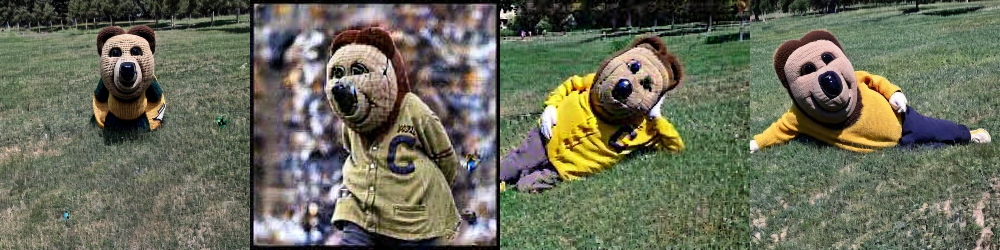

In [ ]:
#@title Run the Stable Diffusion pipeline on Colab
#@markdown Don't forget to use the placeholder token in your prompt

prompt = "Zephon bear" #@param {type:"string"}

num_samples = 4 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=9).images
    all_images.extend(images)

grid = image_grid(all_images, num_rows, num_samples)
grid

In [ ]:
import os
# Directory where you want to save images
save_dir = '/content/diversity_images'
os.makedirs(save_dir, exist_ok=True)


In [ ]:
from PIL import Image

# Save each image
for idx, img in enumerate(all_images):
    img.save(os.path.join(save_dir, f'image_{idx}.png'))


# Get Generated Images for Prior

  0%|          | 0/25 [00:00<?, ?it/s]

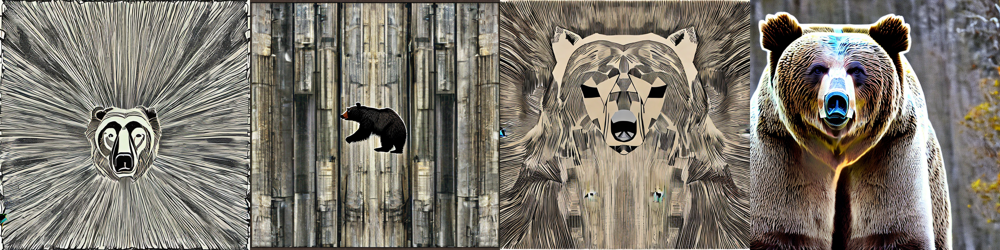

In [ ]:
#@title Run the Stable Diffusion pipeline on Colab
#@markdown Don't forget to use the placeholder token in your prompt

prompt = "bear" #@param {type:"string"}

num_samples = 4 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

generated_pres_images = []
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=9).images
    generated_pres_images.extend(images)

grid = image_grid(generated_pres_images, num_rows, num_samples)
grid

In [ ]:
import os

# Directory where you want to save images
save_dir = '/content/generated_pres_images'
os.makedirs(save_dir, exist_ok=True)


In [ ]:
from PIL import Image

# Save each image
for idx, img in enumerate(generated_pres_images):
    img.save(os.path.join(save_dir, f'image_{idx}.png'))


# Set Up DINO

In [ ]:
import torch
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import os

# Load the processor and model
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
model = AutoModel.from_pretrained('facebook/dinov2-base')

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

# Get Dino Embeddings for Generated Images

In [ ]:
# Directory containing images
directory = 'diversity_images'
generated_embeddings = []

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
        file_path = os.path.join(directory, filename)
        image = Image.open(file_path)

        # Process the image
        inputs = processor(images=image, return_tensors="pt")
        outputs = model(**inputs)
        last_hidden_states = outputs[0]
        generated_embeddings.append(last_hidden_states)
        # Optional: Do something with the embeddings
        # For example, print them or store them
        print(f"Embeddings for {filename}: {last_hidden_states}")

        # If you want to use the traced model, you can do that here as well
        # Note: Tracing should be done outside the loop if the input size is consistent

Embeddings for image_3.png: tensor([[[-1.9277,  1.8163, -0.0646,  ..., -0.0322, -2.9325, -0.0525],
         [-0.7592, -0.6303, -0.8209,  ...,  0.3617, -1.5792,  0.3112],
         [-0.2568,  1.7970,  0.7325,  ..., -0.4948, -2.4878,  0.1149],
         ...,
         [ 0.8935,  1.5195, -3.8339,  ..., -0.8102, -2.0735, -0.4504],
         [ 1.2783,  1.2461, -2.6491,  ...,  0.1529, -2.4800,  0.2384],
         [-0.3877,  0.4846, -2.8229,  ...,  0.7168, -1.5621, -1.3088]]],
       grad_fn=<NativeLayerNormBackward0>)
Embeddings for image_1.png: tensor([[[ 0.6801, -2.8891,  0.8887,  ...,  0.2169, -0.6097,  0.7959],
         [-0.0305, -1.3478, -0.9025,  ..., -0.6438, -1.3030,  0.1689],
         [ 1.7606, -0.1381,  1.0826,  ..., -1.4614, -0.4938, -0.2472],
         ...,
         [ 1.7633, -0.5520, -0.0587,  ...,  1.3926, -0.1663,  1.0425],
         [ 2.1262, -1.2416, -2.6559,  ...,  0.6346, -0.4673, -0.2985],
         [ 3.8872, -0.4598, -0.4617,  ..., -1.5959,  0.6900, -0.7849]]],
       grad_fn=<N

# Get Dino Embeddings for Train set images

In [ ]:
# Directory containing images
directory = 'my_concept'
real_embeddings = []

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
        file_path = os.path.join(directory, filename)
        image = Image.open(file_path)

        # Process the image
        inputs = processor(images=image, return_tensors="pt")
        outputs = model(**inputs)
        last_hidden_states = outputs[0]
        real_embeddings.append(last_hidden_states)
        # Optional: Do something with the embeddings
        # For example, print them or store them
        print(f"Embeddings for {filename}: {last_hidden_states}")

        # If you want to use the traced model, you can do that here as well
        # Note: Tracing should be done outside the loop if the input size is consistent

Embeddings for 2.jpeg: tensor([[[-2.1416e+00,  2.2039e+00, -1.9461e+00,  ..., -3.6615e-01,
          -2.3728e+00,  9.6503e-01],
         [-1.2151e+00, -1.2323e-01,  8.0851e-02,  ..., -6.3327e-01,
          -1.0492e+00,  2.2560e-01],
         [-2.1157e+00, -2.0319e-01, -1.0576e+00,  ..., -2.1106e+00,
          -7.8806e-01,  1.7885e+00],
         ...,
         [-7.8228e-01,  3.4191e+00, -1.5795e+00,  ..., -1.0255e+00,
          -2.2529e+00, -1.4337e+00],
         [-3.5343e-01,  2.3090e+00, -2.6012e+00,  ..., -2.7915e+00,
          -5.8846e-02, -5.5597e-01],
         [-4.2334e-04,  2.0167e+00, -2.9527e+00,  ..., -1.5997e+00,
          -1.4115e+00, -1.3722e+00]]], grad_fn=<NativeLayerNormBackward0>)
Embeddings for 1.jpeg: tensor([[[ 0.6986, -0.0320,  0.2440,  ..., -1.2028, -0.2095,  2.7219],
         [-0.4437, -2.0513, -1.3000,  ..., -0.7412, -1.4605,  0.2360],
         [ 2.0384, -2.0769, -1.1580,  ..., -1.1467, -0.0093,  1.7811],
         ...,
         [ 0.2791, -0.2651, -0.8805,  ...,  0

# Get DINO Embeddings for Prior Preservation

In [ ]:
# Directory containing images
directory = 'class_images'
preservation_embeddings = []

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
        file_path = os.path.join(directory, filename)
        image = Image.open(file_path)

        # Process the image
        inputs = processor(images=image, return_tensors="pt")
        outputs = model(**inputs)
        last_hidden_states = outputs[0]
        preservation_embeddings.append(last_hidden_states)
        # Optional: Do something with the embeddings
        # For example, print them or store them
        print(f"Embeddings for {filename}: {last_hidden_states}")

        # If you want to use the traced model, you can do that here as well
        # Note: Tracing should be done outside the loop if the input size is consistent

Embeddings for 3.jpg: tensor([[[-0.8017, -0.8264,  0.3474,  ...,  1.3464,  1.4305, -0.6589],
         [ 0.6733,  0.3117,  0.4694,  ...,  0.3049,  1.1730, -0.4602],
         [-1.0016, -0.2558, -0.3095,  ...,  0.8609,  1.6190, -1.4093],
         ...,
         [ 0.3780, -2.7246, -1.7455,  ..., -1.2525,  0.8287, -0.1334],
         [-0.4739, -2.7670, -0.5931,  ...,  2.0978,  0.9500, -1.8240],
         [ 1.9335, -3.1164, -0.3583,  ...,  1.9123,  1.2867, -1.9386]]],
       grad_fn=<NativeLayerNormBackward0>)
Embeddings for 1.jpg: tensor([[[-1.2319, -0.6624,  0.9751,  ...,  0.5397,  0.7401,  3.4746],
         [-0.0856, -0.7838,  0.1048,  ..., -0.1681,  0.2295, -0.3748],
         [ 1.6984, -0.1730, -1.2805,  ...,  0.8542,  0.2321,  0.6354],
         ...,
         [ 1.0797, -0.1214, -1.4001,  ..., -0.1569, -0.2957,  1.6258],
         [ 1.6539, -1.0264, -2.6852,  ..., -0.0267, -1.9613, -1.4481],
         [ 2.0266,  1.2621, -2.9800,  ...,  2.1155,  1.2926,  1.6887]]],
       grad_fn=<NativeLayerNo

# Get DINO embedding for generated prior pres images


In [ ]:
# Directory containing images
directory = 'generated_pres_images'
generated_pres_embeddings = []

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
        file_path = os.path.join(directory, filename)
        image = Image.open(file_path)

        # Process the image
        inputs = processor(images=image, return_tensors="pt")
        outputs = model(**inputs)
        last_hidden_states = outputs[0]
        generated_pres_embeddings.append(last_hidden_states)
        # Optional: Do something with the embeddings
        # For example, print them or store them
        print(f"Embeddings for {filename}: {last_hidden_states}")

        # If you want to use the traced model, you can do that here as well
        # Note: Tracing should be done outside the loop if the input size is consistent

Embeddings for image_3.png: tensor([[[ 0.6073, -1.3097,  0.8320,  ..., -2.5176,  2.1168,  3.1986],
         [ 0.5643, -1.0984, -0.3109,  ..., -0.0399,  0.7407, -1.1034],
         [ 1.3522, -0.3909,  0.8151,  ..., -2.0658,  1.4194,  1.2410],
         ...,
         [-0.2437,  1.0953, -1.2972,  ...,  0.3975,  1.3182,  2.0262],
         [ 1.3107,  1.3227, -2.7051,  ..., -0.3476,  0.9993,  1.1784],
         [ 1.6965,  1.6057, -1.8526,  ..., -0.1233,  1.8481,  1.4753]]],
       grad_fn=<NativeLayerNormBackward0>)
Embeddings for image_1.png: tensor([[[-0.1654, -2.4141,  0.3277,  ..., -1.8647,  1.1345,  2.4482],
         [ 0.5297, -0.0664,  0.2630,  ..., -0.8021, -0.1397,  0.0628],
         [ 2.4216, -0.0637, -2.2427,  ..., -2.9354, -1.0842,  1.3396],
         ...,
         [ 0.8830, -0.8758, -1.2793,  ..., -3.7527, -2.0151,  2.5326],
         [ 2.3657,  2.5825, -0.8164,  ..., -0.8345, -1.4315,  1.0114],
         [ 2.2573, -0.0111,  0.3569,  ..., -2.2196,  0.0263,  1.3944]]],
       grad_fn=<N

# DINO Metric

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Flatten the embeddings
generated_flat = [e.view(-1).detach().numpy() for e in generated_embeddings]
real_flat = [e.view(-1).detach().numpy() for e in real_embeddings]
preservation_flat = [e.view(-1).detach().numpy() for e in preservation_embeddings]
generated_pres_flat = [e.view(-1).detach().numpy() for e in generated_pres_embeddings]

# Convert lists to numpy arrays
generated_array = np.stack(generated_flat)
real_array = np.stack(real_flat)
preservation_array = np.stack(preservation_flat)
generated_pres_array = np.stack(generated_pres_flat)


In [ ]:
#Prior Preservation
# Compute pairwise cosine similarity
similarities = cosine_similarity(preservation_array, generated_pres_array)

# Calculate the mean similarity
mean_similarity = np.mean(similarities)

print("Prior Preseravation:", mean_similarity)


Prior Preseravation: 0.17998599


In [ ]:
#Diversity
variability = np.var(generated_array)
print("Diversity:", variability)

Diversity: 2.871125


In [ ]:
#Standard DINO
# Compute pairwise cosine similarity
similarities = cosine_similarity(generated_array, real_array)

# Calculate the mean similarity
mean_similarity = np.mean(similarities)

print("DINO (Comparison between actual and generated images):", mean_similarity)


DINO (Comparison between actual and generated images): 0.22919095


The Remaining cells are used to do a hyperparameter search, training multiple models and then graphing the resulting performance on several metrics.

# Evaluate Model

In [ ]:
import os
from PIL import Image
import torch
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import os
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
# Load the processor and model
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
model = AutoModel.from_pretrained('facebook/dinov2-base')


def evaluate_model(pipe):
  prompt = "additions woman"

  num_samples = 4
  num_rows = 1

  all_images = []
  for _ in range(num_rows):
      images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=9).images
      all_images.extend(images)
  # Directory where you want to save images
  save_dir = '/content/generated_subject'
  os.makedirs(save_dir, exist_ok=True)
  # Save each image
  for idx, img in enumerate(all_images):
      img.save(os.path.join(save_dir, f'image_{idx}.png'))


  prompt = "an hd color photo of a woman"

  num_samples = 4
  num_rows = 1
  generated_pres_images = []
  for _ in range(num_rows):
      images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=25, guidance_scale=9).images
      generated_pres_images.extend(images)

  # Directory where you want to save images
  save_dir = '/content/generated_pres_images'
  os.makedirs(save_dir, exist_ok=True)
  # Save each image
  for idx, img in enumerate(generated_pres_images):
      img.save(os.path.join(save_dir, f'image_{idx}.png'))

  def get_DINO_embeddings(directory):
    embeddings = []

    # Iterate over each file in the directory
    for filename in os.listdir(directory):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif')):
            file_path = os.path.join(directory, filename)
            image = Image.open(file_path)

            # Process the image
            inputs = processor(images=image, return_tensors="pt")
            outputs = model(**inputs)
            last_hidden_states = outputs[0]
            embeddings.append(last_hidden_states)
    flat = [e.view(-1).detach().numpy() for e in embeddings]
    embeddings = np.stack(flat)
    return embeddings

  generated_subject_embeddings = get_DINO_embeddings("generated_subject")
  real_subject_embeddings = get_DINO_embeddings("my_concept")
  prior_class_embeddings = get_DINO_embeddings("class_images")
  generated_class_embeddings = get_DINO_embeddings("generated_pres_images")

  #Prior Preservation
  similarities = cosine_similarity(prior_class_embeddings, generated_class_embeddings)
  prior_preservation = np.mean(similarities)
  #print("Prior Preservation:", prior_preservation)

  #Diversity
  diversity = np.var(generated_subject_embeddings)
  #print("Diversity:", diversity)

  #Standard DINO
  # Compute pairwise cosine similarity
  reconstruction = cosine_similarity(generated_subject_embeddings, real_subject_embeddings)

  # Calculate the mean similarity
  standard_dino = np.mean(reconstruction)

  #print("DINO (Comparison between actual and generated images):", standard_dino)

  return {"Prior Preservation": prior_preservation, "Diversity": diversity, "Standard DINO": standard_dino}



preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

# Hyper Parameter Search

In [ ]:
from argparse import Namespace
import accelerate
from accelerate.utils import set_seed
from diffusers import DPMSolverMultistepScheduler


##### ENTER VALUE TO BE TESTED
hyper_parameter_values = [5e-7]

###############




diversity = []
prior_preservation = []
standard_dino = []

instance_losses = []
class_losses = []
for hyper_parameter in hyper_parameter_values:

  #### Re-download model to fine tune ######

  text_encoder = CLIPTextModel.from_pretrained(
    pretrained_model_name_or_path, subfolder="text_encoder"
  ).to("cuda")
  vae = AutoencoderKL.from_pretrained(
      pretrained_model_name_or_path, subfolder="vae"
  ).to("cuda")
  unet = UNet2DConditionModel.from_pretrained(
      pretrained_model_name_or_path, subfolder="unet"
  ).to("cuda")
  tokenizer = CLIPTokenizer.from_pretrained(
      pretrained_model_name_or_path,
      subfolder="tokenizer",
  )




  ##############

  ##SET HYPERPARAMETERS ####################
  args = Namespace( ### REPLACE EXPERIMENTAL PARAMETER WITH 'hyper_parameter'
      pretrained_model_name_or_path=pretrained_model_name_or_path,
      resolution=vae.sample_size,
      center_crop=True,
      train_text_encoder=False,
      instance_data_dir=save_path,
      instance_prompt=instance_prompt,
      learning_rate=hyper_parameter, #Currently learning_rate is the experimental parameter
      max_train_steps=200,#300
      save_steps=10000,
      train_batch_size=1, # set to 1 if using prior preservation
      gradient_accumulation_steps=2,
      max_grad_norm=1.0,
      mixed_precision="fp16", # set to "fp16" for mixed-precision training.
      gradient_checkpointing=True, # set this to True to lower the memory usage.
      use_8bit_adam=True, # use 8bit optimizer from bitsandbytes
      seed=3434554,
      with_prior_preservation=prior_preservation,
      prior_loss_weight=prior_loss_weight,
      sample_batch_size=2,
      class_data_dir=prior_preservation_class_folder,
      class_prompt=prior_preservation_class_prompt,
      num_class_images=num_class_images,
      lr_scheduler="constant",
      lr_warmup_steps=100,
      output_dir="dreambooth-concept",
  )
  #####################


  #####FINETUNE MODEL #################
  instance_loss = []
  class_loss = []
  accelerate.notebook_launcher(training_function, args=(text_encoder, vae, unet))
  for param in itertools.chain(unet.parameters(), text_encoder.parameters()):
    if param.grad is not None:
      del param.grad  # free some memory
    torch.cuda.empty_cache()

  instance_losses.append(instance_loss.copy())
  class_losses.append(class_loss.copy())

  ######################################

  ##########GET PIPE ###################
  try:
    pipe
  except NameError:
      pipe = StableDiffusionPipeline.from_pretrained(
          args.output_dir,
          scheduler = DPMSolverMultistepScheduler.from_pretrained(args.output_dir, subfolder="scheduler"),
          torch_dtype=torch.float16,
      ).to("cuda")
  ######################################

  metrics = evaluate_model(pipe)
  diversity.append(metrics["Diversity"])
  prior_preservation.append(metrics["Prior Preservation"])
  standard_dino.append(metrics["Standard DINO"])

  ##### Clear up memory ##########
  torch.cuda.empty_cache()

  text_encoder.to("cpu")
  vae.to("cpu")
  unet.to("cpu")
  pipe.to("cpu")

  del text_encoder
  del vae
  del unet
  del tokenizer
  del pipe
  torch.cuda.empty_cache()

  gc.collect()
  ####################

<ipython-input-35-502106518430>:47: FutureWarning: Accessing config attribute `sample_size` directly via 'AutoencoderKL' object attribute is deprecated. Please access 'sample_size' over 'AutoencoderKL's config object instead, e.g. 'unet.config.sample_size'.
  resolution=vae.sample_size,


Launching training on one GPU.


  0%|          | 0/200 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, du

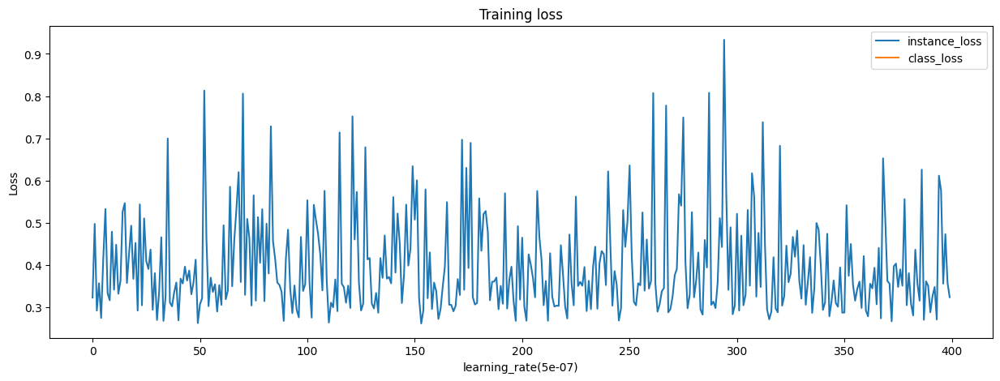

In [ ]:
##Get Loss Curves

import matplotlib.pyplot as plt
hyper_parameter_name = "learning_rate"

def plot_loss(instance_loss, class_loss, hyper_parameter_value, hyper_parameter_name):
  _instance_loss = [loss.cpu().detach().numpy().item() for loss in instance_loss]
  _class_loss = [loss.cpu().detach().numpy().item() for loss in class_loss]
  plt.figure(figsize=(15, 5))
  plt.title("Training loss")
  plt.xlabel(hyper_parameter_name+f"({hyper_parameter_value})")
  plt.ylabel("Loss")
  plt.plot(_instance_loss, label="instance_loss")
  plt.plot(_class_loss, label="class_loss")
  plt.legend()
  plt.show()

for i, hyper_parameter_value in enumerate(hyper_parameter_values):
  plot_loss(instance_losses[i], class_losses[i], hyper_parameter_value, hyper_parameter_name)


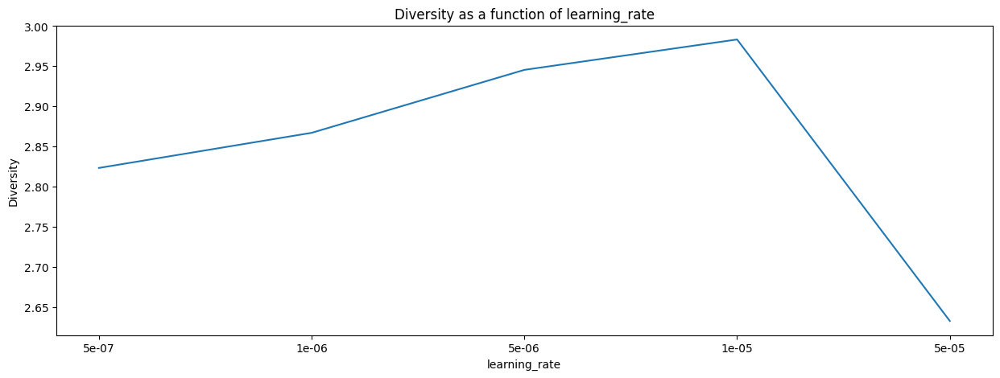

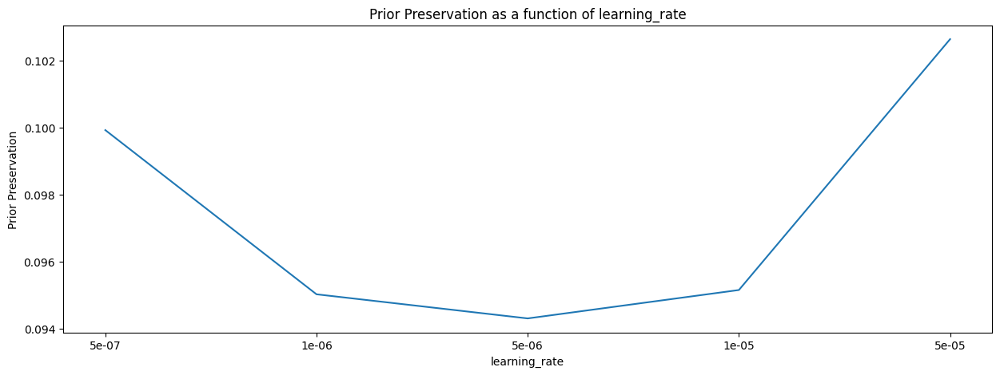

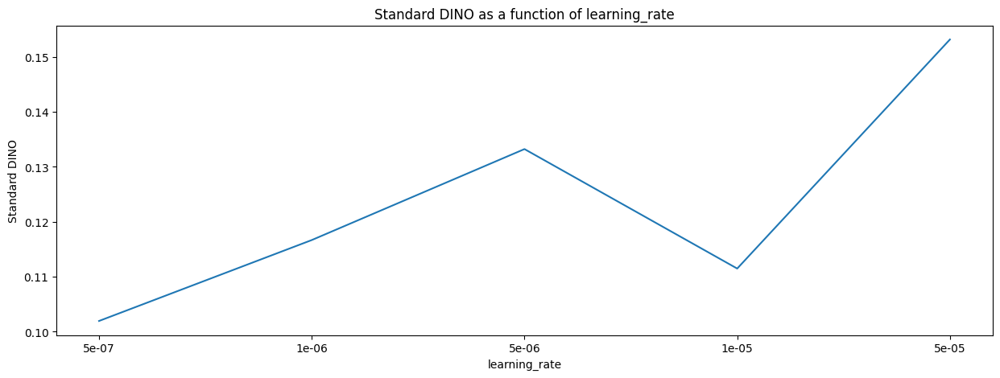

In [ ]:
## Plot Metrics over Hyper Parameter Settings
def plot_metrics(diversity, prior_preservation, standard_dino, hyper_parameter_values, hyper_parameter_name):
  metric_names = ["Diversity", "Prior Preservation", "Standard DINO"]
  metrics = [diversity, prior_preservation, standard_dino]

  for i, metric in enumerate(metrics):
    x_indices = np.arange(len(hyper_parameter_values))
    value_string = [str(value) for value in hyper_parameter_values]
    plt.figure(figsize=(15, 5))
    plt.title(f"{metric_names[i]} as a function of {hyper_parameter_name}")
    plt.xlabel(hyper_parameter_name)
    plt.ylabel(metric_names[i])
    plt.plot(x_indices, metric)
    plt.xticks(x_indices, value_string)

    plt.show()

plot_metrics(diversity, prior_preservation, standard_dino, hyper_parameter_values, hyper_parameter_name)

In [ ]:
print(diversity)
print(prior_preservation)
print(standard_dino)
print(hyper_parameter_values)

[2.8233263, 2.867027, 2.9453585, 2.9831805, 2.6329057]
[0.09992375, 0.095028706, 0.09430933, 0.09515613, 0.10263499]
[0.10193513, 0.11666584, 0.1332308, 0.11147782, 0.15318583]
[5e-07, 1e-06, 5e-06, 1e-05, 5e-05]


In [ ]:
diversity = [2.8233263, 2.867027, 2.9453585, 2.9831805, 2.6329057]

prior_preservation = [0.09992375, 0.095028706, 0.09430933, 0.09515613, 0.10263499]

standard_dino =[0.10193513, 0.11666584, 0.1332308, 0.11147782, 0.15318583]

hyper_parameter_values =[5e-07, 1e-06, 5e-06, 1e-05, 5e-05]
